In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification, make_moons, make_circles
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
from matplotlib.colors import ListedColormap
from sklearn.utils import resample
from sklearn.preprocessing import MinMaxScaler

In [13]:
def plot_datasets(datasets):
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()

    for i, (name, (X, y)) in enumerate(datasets.items()):

        axes[i].scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', edgecolor='k')
        axes[i].set_title(name)

    plt.tight_layout()
    plt.show()



In [94]:

def generate_datasets(n_samples=600, noise_level=0.5):
    datasets = {}
    scaler = MinMaxScaler()

    spread = 1
    samples_per_class = n_samples // 3

    # === Separated ===
    X_0 = np.random.uniform(low=[0.1, 0.1], high=[0.1 + spread, 0.1 + spread], size=(samples_per_class, 2))
    X_1 = np.random.uniform(low=[0.1, -0.1 - spread], high=[0.1 + spread, -0.1], size=(samples_per_class, 2))
    X_2 = np.random.uniform(low=[-1 + spread, -0.5], high=[-1.1, -0.5 + spread], size=(n_samples - 2 * samples_per_class, 2))

    X_sep = np.vstack((X_0, X_1, X_2))
    y_sep = np.hstack((
        np.zeros(len(X_0)),
        np.ones(len(X_1)),
        np.full(len(X_2), 2)
    ))
    # X_sep = scaler.fit_transform(X_sep)
    datasets['Separated'] = (X_sep, y_sep)

    # === Two Lines → Three Lines ===
    def gen_line(slope, intercept, size):
        x = np.linspace(-3, 3, size)
        y = slope * x + intercept + np.random.normal(0, noise_level, size)
        return np.column_stack((x, y))

    X_0 = np.random.multivariate_normal([0, 0], [[1.5, 0.7], [0.7, 1.5]], samples_per_class)
    X_1 = gen_line(-1, 0, samples_per_class)
    X_2 = gen_line(1, -1, n_samples - 2 * samples_per_class)

    X_tl = np.vstack((X_0, X_1, X_2))
    y_tl = np.hstack((
        np.zeros(len(X_0)),
        np.ones(len(X_1)),
        np.full(len(X_2), 2)
    ))
    X_tl = scaler.fit_transform(X_tl)
    datasets['Three Lines'] = (X_tl, y_tl)



    # === Moons + Extra Class ===
    # X_moon1, y1 = make_moons(n_samples=samples_per_class, noise=noise_level)
    # X_moon2, y2 = make_moons(n_samples=samples_per_class, noise=noise_level)
    # X_extra = np.random.normal(0, 0.4, size=(n_samples - 2 * samples_per_class, 2))
    #
    # y1 = y1  # class 0 and 1
    # y2 = y2 + 2  # offset to create class 2 and 3, we'll remap
    #
    # X_moons = np.vstack((X_moon1[y1 == 0], X_moon1[y1 == 1], X_extra))
    # y_moons = np.array([0] * np.sum(y1 == 0) + [1] * np.sum(y1 == 1) + [2] * len(X_extra))

    X_moons, y_moons = make_moons(n_samples=n_samples, noise=noise_level)
    X_moons2, y_moons2 = make_moons(n_samples=n_samples, noise=noise_level)
    X_moons = np.vstack((X_moons, X_moons2[y_moons2==0]-1))
    y_moons = np.hstack((y_moons, y_moons2[y_moons2==0]+2))
    X_moons = scaler.fit_transform(X_moons)
    datasets['Moons'] = (X_moons, y_moons)


    # === Circles + Extra Class ===
    X_circles, y_circles = make_circles(n_samples=n_samples, factor=0.5, noise=noise_level-0.02)
    X_circles2, y_circles2 = make_circles(n_samples=n_samples, factor=0, noise=noise_level-0.02)

    X_circles = np.vstack((X_circles, X_circles2[y_circles2==1]))
    y_circles = np.hstack((y_circles, y_circles2[y_circles2==1]+1))

    # X_circles = scaler.fit_transform(X_circles)
    datasets['Circles'] = (X_circles, y_circles)

    # === Random ===
    X_random = np.random.random_sample((n_samples, 2))
    y_random = np.random.randint(0, 3, n_samples)
    X_random = scaler.fit_transform(X_random)
    datasets['Random'] = (X_random, y_random)

    # === Cross (Chessboard style with 3 classes) ===
    X_cross = np.random.rand(n_samples, 2) * 2 - 1
    thresholds = [-0.2, 0.2]  # Define regions

    y_cross = np.zeros(n_samples, dtype=int)
    y_cross[(X_cross[:, 0] * X_cross[:, 1]) > thresholds[1]] = 1
    y_cross[(X_cross[:, 0] * X_cross[:, 1]) < thresholds[0]] = 2

    datasets['Cross'] = (X_cross, y_cross)

    return datasets

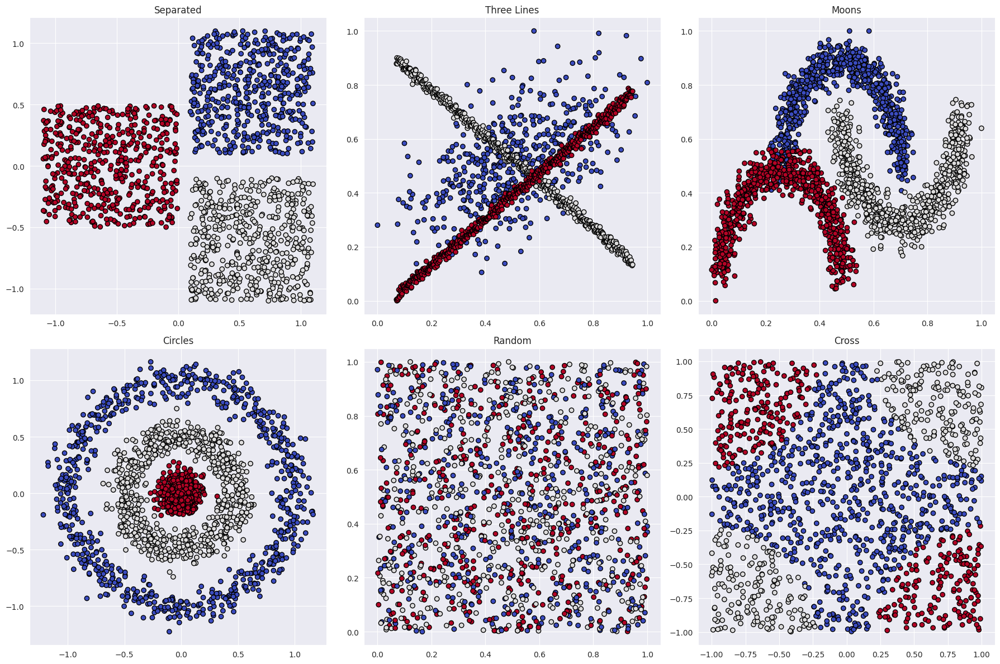

In [95]:
# Generate and plot datasets
datasets = generate_datasets(n_samples=1500, noise_level=0.1)
plot_datasets(datasets)

In [142]:
def plot_decision_boundary(model, X, y, ax):
    """Plots decision boundary for a 2D dataset on a given subplot axis."""

    h = 0.02  # step size in the mesh

    # Create a mesh grid
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # Predict over grid
    try:
        if hasattr(model, "predict_proba"):
            Z = model.predict_proba(np.c_[xx.ravel(), yy.ravel()])
            Z = np.argmax(Z, axis=1)
        else:
            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    except Exception as e:
        print(f"Error during prediction: {e}")
        return

    Z = Z.reshape(xx.shape)


     # Plot the decision boundary
    cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF', '#FFFF00'])
    cmap_bold = ListedColormap(['red', 'blue', 'yellow'])

    ax.contourf(xx, yy, Z, alpha=0.3, cmap=cmap_light)
    ax.contour(xx, yy, Z, levels=np.arange(-0.5, np.max(y) + 1.5, 1), colors='k', linewidths=2)

    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=cmap_bold)

    # Labels
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

    # except Exception as e:
    #     # ax.set_title("Error: Decision Boundary Unavailable")
    #     print(f"Error plotting decision boundary: {e}")


In [140]:
def evaluate_model(model, model_name, datasets):
    for name, (X, y) in datasets.items():
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)
        elif hasattr(model, "decision_function"):
            y_prob = model.decision_function(X_test)
        else:
            y_prob = None

        #validação cruzada
        # scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
        # print(f"\n{name} - {model_name}")
        # print(f"Accuracy (cross-validation): {scores.mean():.4f} ± {scores.std():.4f}")

        fig, axes = plt.subplots(1, 3, figsize=(20, 4))

        axes = axes.ravel()

        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0])
        axes[0].set_xlabel('Predicted')
        axes[0].set_ylabel('Actual')
        axes[0].set_title(f'Confusion Matrix - {name}')

        # if len(np.unique(y)) == 2 and y_prob is not None:
        # fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
        # roc_auc = auc(fpr, tpr)
        # axes[1].plot(fpr, tpr, color='blue', label=f'AUC = {roc_auc:.2f}')
        # axes[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
        # axes[1].set_xlabel('False Positive Rate')
        # axes[1].set_ylabel('True Positive Rate')
        # axes[1].set_title(f'ROC Curve - {name}')
        # axes[1].legend()
        # else:
        #     axes[1].axis('off')  # Hide this plot if ROC is not applicable



        # Decision Boundary (Only for 2D binary classification)
        # if X.shape[1] == 2 and len(np.unique(y)) == 2:
        plot_decision_boundary(model, X_test, y_pred, axes[1])
        axes[1].set_title(f"Decision Boundary (Pred) - {name} ({model_name})")
        # else:
        #     axes[1].axis('off')

        # if X.shape[1] == 2 and len(np.unique(y)) == 2:
        plot_decision_boundary(model, X_test, y_test, axes[2])
        axes[2].set_title(f"Decision Boundary (Real) - {name} ({model_name})")
        # else:
        #     axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Classification Report {name}:")
        print(classification_report(y_test, y_pred, zero_division=1))


        if X.shape[1] == 2 and len(np.unique(y)) == 2:
            plot_decision_boundary(model, X, y, f"Decision Boundary - {name} ({model_name})")

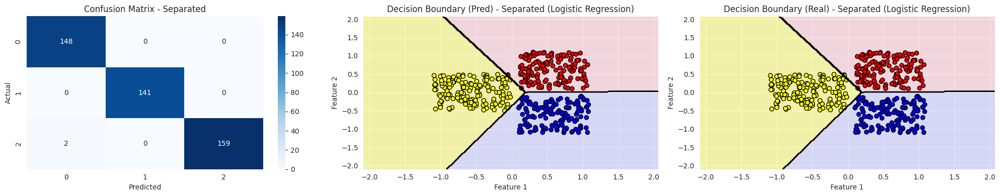

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      0.99      0.99       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



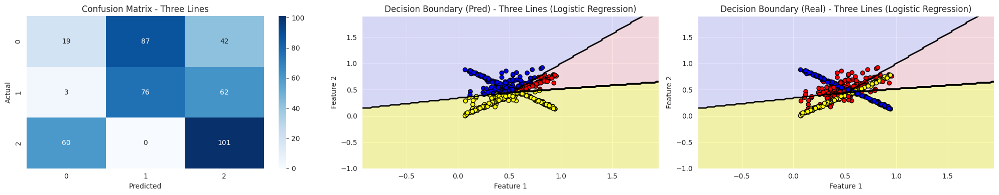

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.23      0.13      0.17       148
         1.0       0.47      0.54      0.50       141
         2.0       0.49      0.63      0.55       161

    accuracy                           0.44       450
   macro avg       0.40      0.43      0.41       450
weighted avg       0.40      0.44      0.41       450



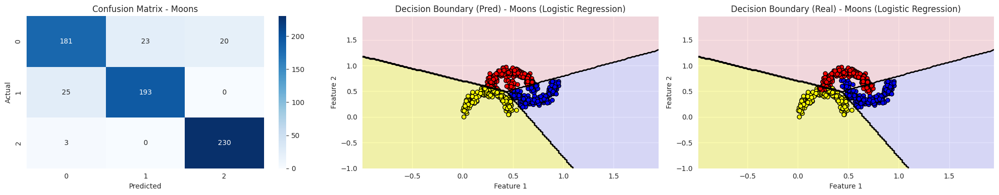

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.87      0.81      0.84       224
           1       0.89      0.89      0.89       218
           2       0.92      0.99      0.95       233

    accuracy                           0.89       675
   macro avg       0.89      0.89      0.89       675
weighted avg       0.89      0.89      0.89       675



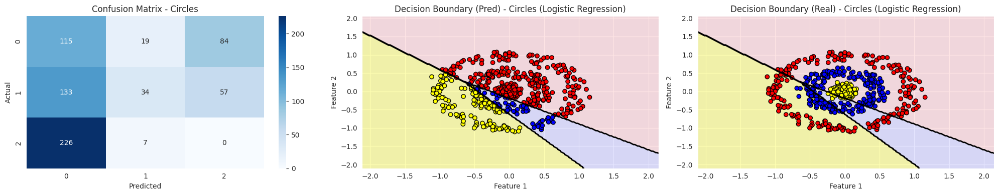

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.24      0.53      0.33       218
           1       0.57      0.15      0.24       224
           2       0.00      0.00      0.00       233

    accuracy                           0.22       675
   macro avg       0.27      0.23      0.19       675
weighted avg       0.27      0.22      0.19       675



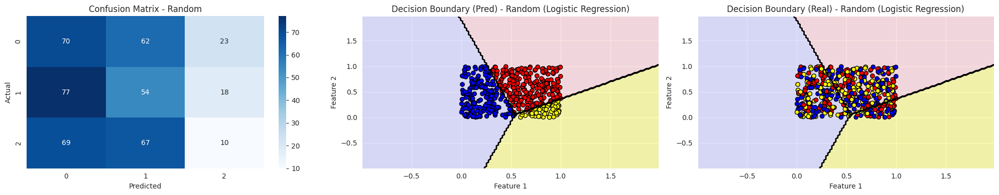

Classification Report Random:
              precision    recall  f1-score   support

           0       0.32      0.45      0.38       155
           1       0.30      0.36      0.33       149
           2       0.20      0.07      0.10       146

    accuracy                           0.30       450
   macro avg       0.27      0.29      0.27       450
weighted avg       0.27      0.30      0.27       450



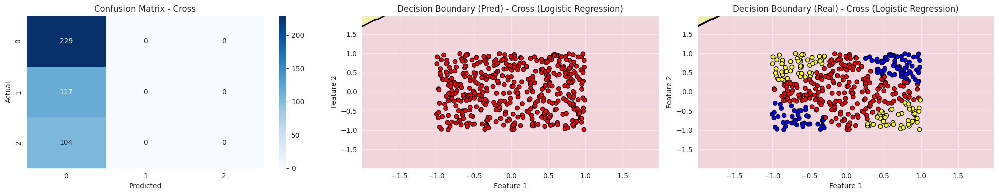

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.51      1.00      0.67       229
           1       1.00      0.00      0.00       117
           2       1.00      0.00      0.00       104

    accuracy                           0.51       450
   macro avg       0.84      0.33      0.22       450
weighted avg       0.75      0.51      0.34       450



In [143]:
evaluate_model(LogisticRegression(), "Logistic Regression", datasets)

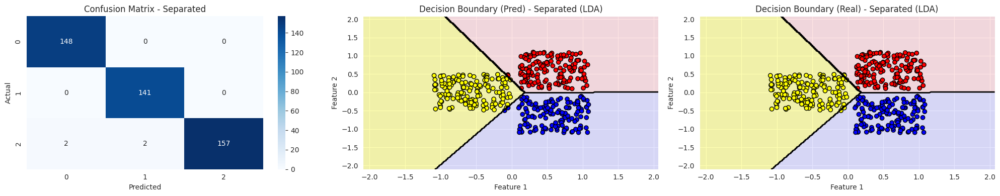

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99       148
         1.0       0.99      1.00      0.99       141
         2.0       1.00      0.98      0.99       161

    accuracy                           0.99       450
   macro avg       0.99      0.99      0.99       450
weighted avg       0.99      0.99      0.99       450



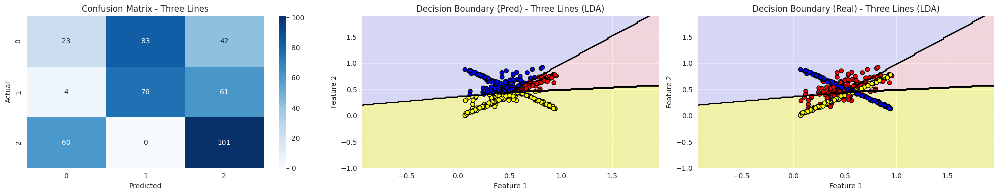

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.26      0.16      0.20       148
         1.0       0.48      0.54      0.51       141
         2.0       0.50      0.63      0.55       161

    accuracy                           0.44       450
   macro avg       0.41      0.44      0.42       450
weighted avg       0.41      0.44      0.42       450



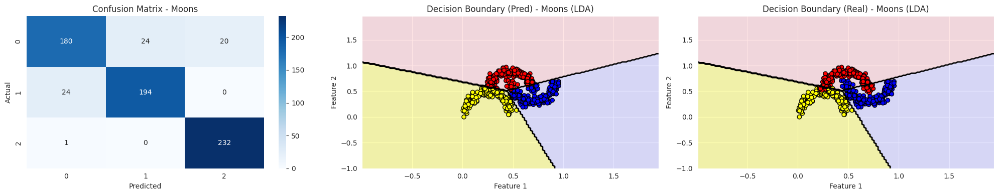

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.88      0.80      0.84       224
           1       0.89      0.89      0.89       218
           2       0.92      1.00      0.96       233

    accuracy                           0.90       675
   macro avg       0.90      0.90      0.90       675
weighted avg       0.90      0.90      0.90       675



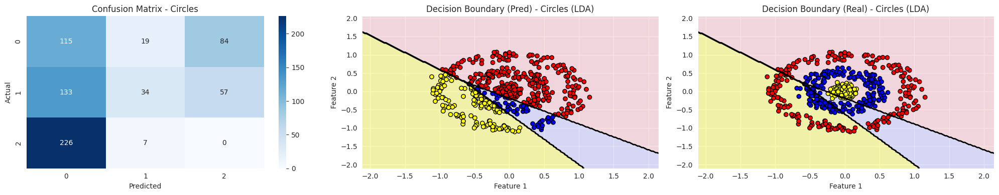

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.24      0.53      0.33       218
           1       0.57      0.15      0.24       224
           2       0.00      0.00      0.00       233

    accuracy                           0.22       675
   macro avg       0.27      0.23      0.19       675
weighted avg       0.27      0.22      0.19       675



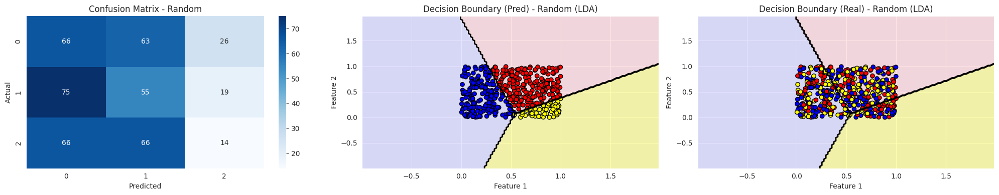

Classification Report Random:
              precision    recall  f1-score   support

           0       0.32      0.43      0.36       155
           1       0.30      0.37      0.33       149
           2       0.24      0.10      0.14       146

    accuracy                           0.30       450
   macro avg       0.29      0.30      0.28       450
weighted avg       0.29      0.30      0.28       450



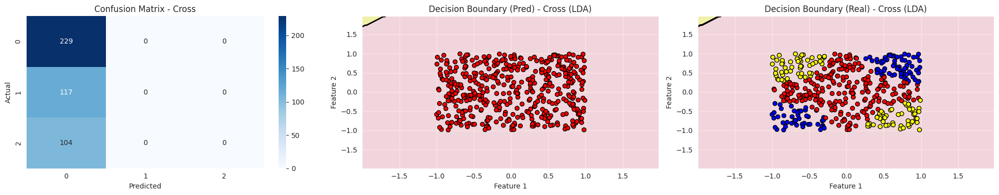

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.51      1.00      0.67       229
           1       1.00      0.00      0.00       117
           2       1.00      0.00      0.00       104

    accuracy                           0.51       450
   macro avg       0.84      0.33      0.22       450
weighted avg       0.75      0.51      0.34       450



In [144]:
evaluate_model(LinearDiscriminantAnalysis(), "LDA", datasets)

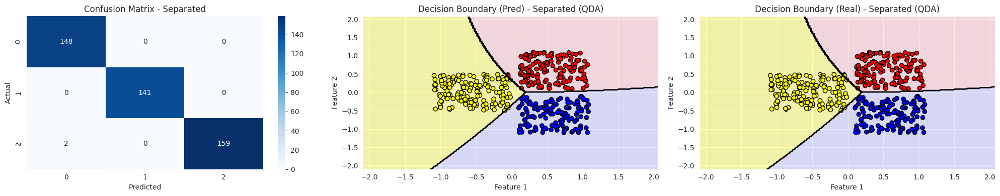

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      0.99      0.99       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



/home/joaomonteiro/Desktop/ML/env_ml/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/home/joaomonteiro/Desktop/ML/env_ml/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 2 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


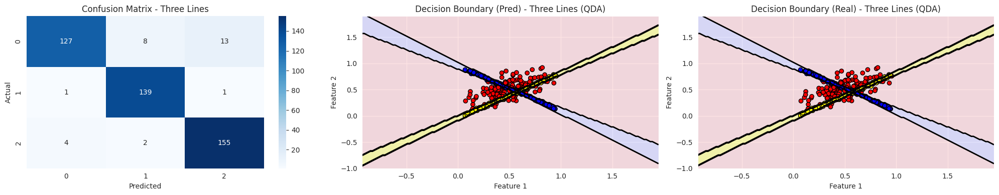

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.96      0.86      0.91       148
         1.0       0.93      0.99      0.96       141
         2.0       0.92      0.96      0.94       161

    accuracy                           0.94       450
   macro avg       0.94      0.94      0.94       450
weighted avg       0.94      0.94      0.93       450



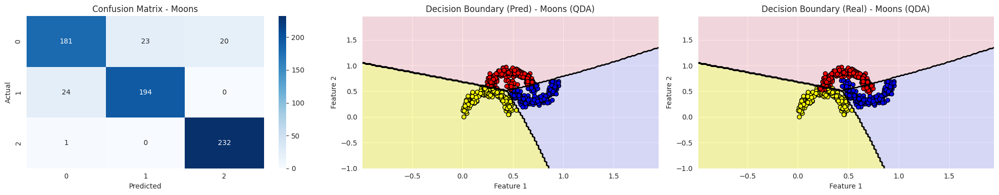

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.88      0.81      0.84       224
           1       0.89      0.89      0.89       218
           2       0.92      1.00      0.96       233

    accuracy                           0.90       675
   macro avg       0.90      0.90      0.90       675
weighted avg       0.90      0.90      0.90       675



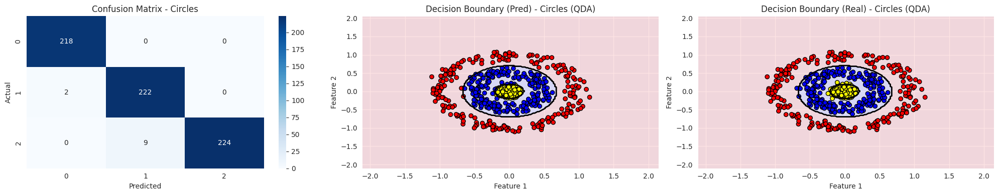

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       218
           1       0.96      0.99      0.98       224
           2       1.00      0.96      0.98       233

    accuracy                           0.98       675
   macro avg       0.98      0.98      0.98       675
weighted avg       0.98      0.98      0.98       675



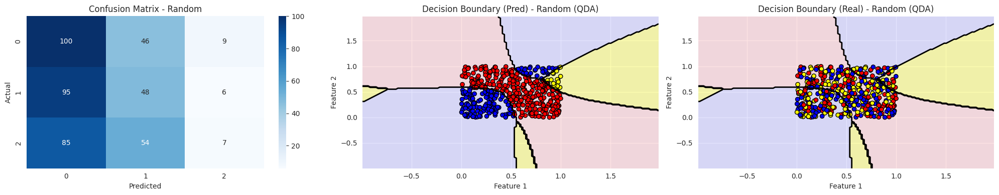

Classification Report Random:
              precision    recall  f1-score   support

           0       0.36      0.65      0.46       155
           1       0.32      0.32      0.32       149
           2       0.32      0.05      0.08       146

    accuracy                           0.34       450
   macro avg       0.33      0.34      0.29       450
weighted avg       0.33      0.34      0.29       450



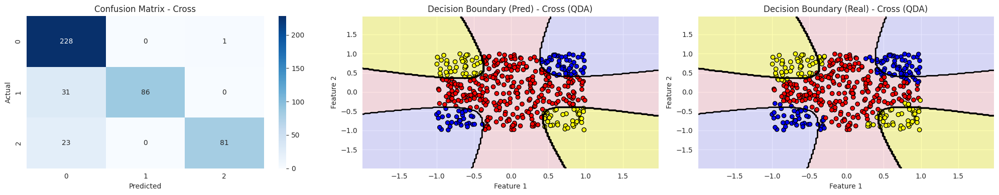

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.81      1.00      0.89       229
           1       1.00      0.74      0.85       117
           2       0.99      0.78      0.87       104

    accuracy                           0.88       450
   macro avg       0.93      0.84      0.87       450
weighted avg       0.90      0.88      0.88       450



In [145]:
evaluate_model(QuadraticDiscriminantAnalysis(), "QDA", datasets)


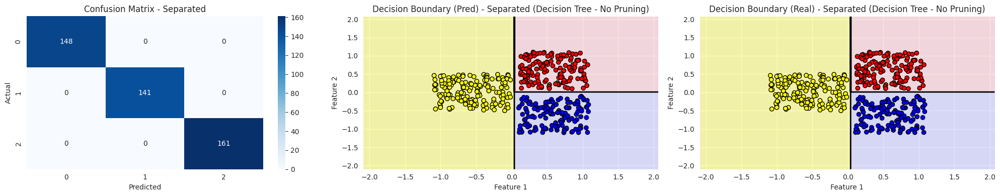

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      1.00      1.00       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



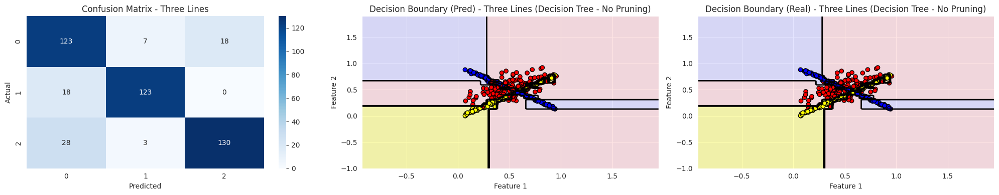

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.73      0.83      0.78       148
         1.0       0.92      0.87      0.90       141
         2.0       0.88      0.81      0.84       161

    accuracy                           0.84       450
   macro avg       0.84      0.84      0.84       450
weighted avg       0.84      0.84      0.84       450



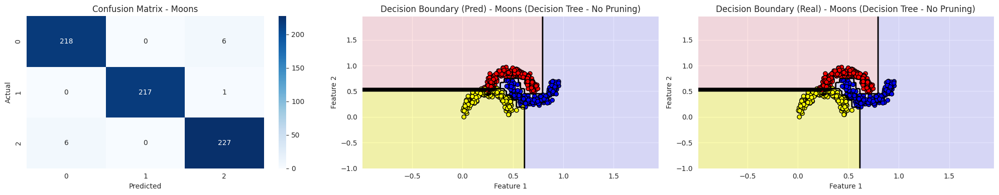

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       224
           1       1.00      1.00      1.00       218
           2       0.97      0.97      0.97       233

    accuracy                           0.98       675
   macro avg       0.98      0.98      0.98       675
weighted avg       0.98      0.98      0.98       675



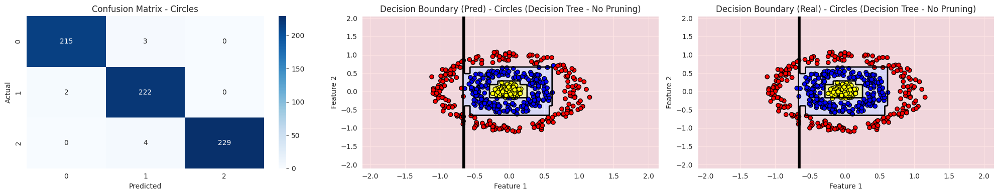

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       218
           1       0.97      0.99      0.98       224
           2       1.00      0.98      0.99       233

    accuracy                           0.99       675
   macro avg       0.99      0.99      0.99       675
weighted avg       0.99      0.99      0.99       675



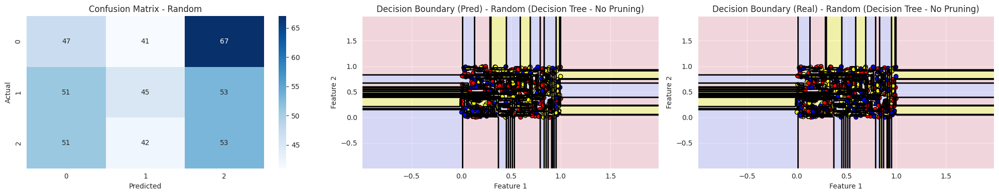

Classification Report Random:
              precision    recall  f1-score   support

           0       0.32      0.30      0.31       155
           1       0.35      0.30      0.32       149
           2       0.31      0.36      0.33       146

    accuracy                           0.32       450
   macro avg       0.32      0.32      0.32       450
weighted avg       0.32      0.32      0.32       450



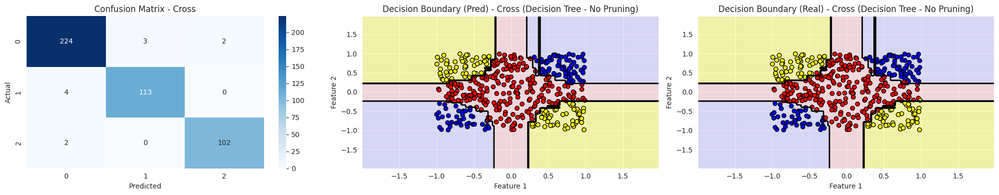

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       229
           1       0.97      0.97      0.97       117
           2       0.98      0.98      0.98       104

    accuracy                           0.98       450
   macro avg       0.98      0.97      0.98       450
weighted avg       0.98      0.98      0.98       450



In [146]:
evaluate_model(DecisionTreeClassifier(), "Decision Tree - No Pruning", datasets)

In [13]:
from sklearn.tree import plot_tree

def plot_decision_trees_for_all_datasets(datasets, max_depth=None):
    for name, (X, y) in datasets.items():
        if len(np.unique(y)) > 2:
            continue

        model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
        model.fit(X, y)

        plt.figure(figsize=(12, 6))
        plot_tree(model, filled=True, feature_names=["Feature 1", "Feature 2"], class_names=["Class 0", "Class 1"])
        plt.title(f"Decision Tree - {name} ")
        plt.show()


Decision Trees without pruning:


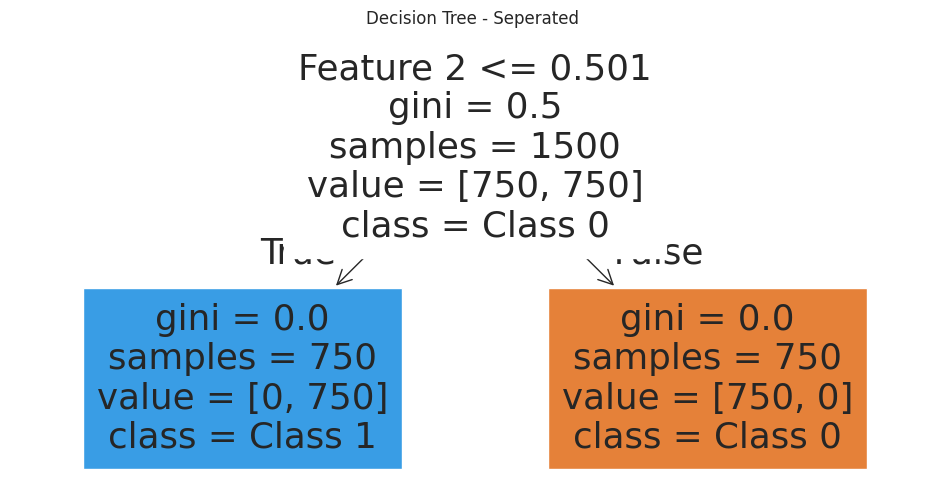

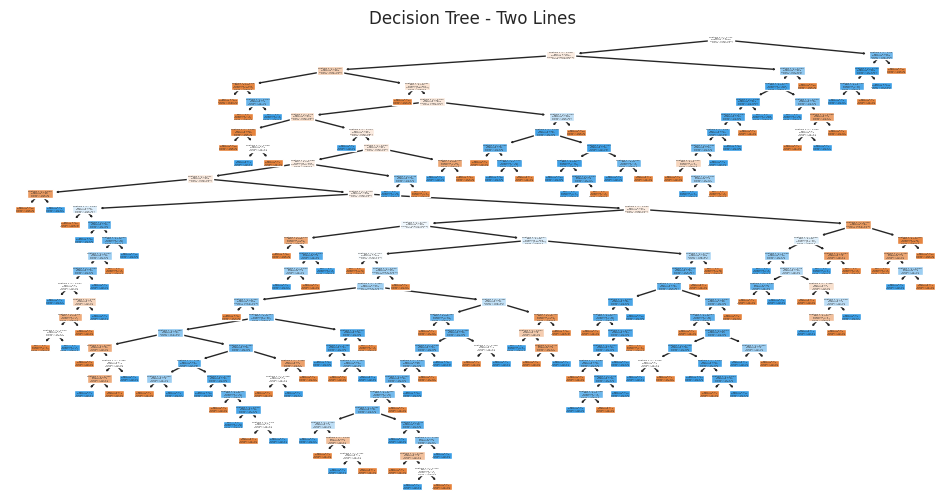

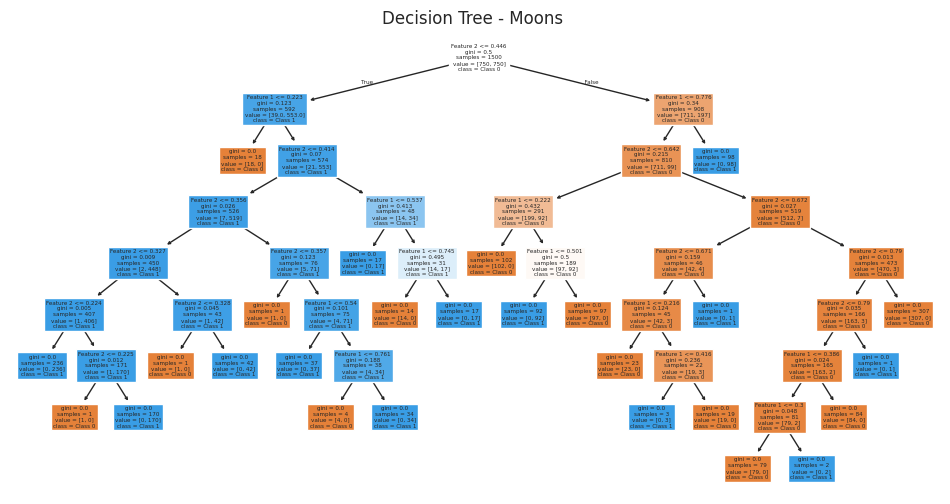

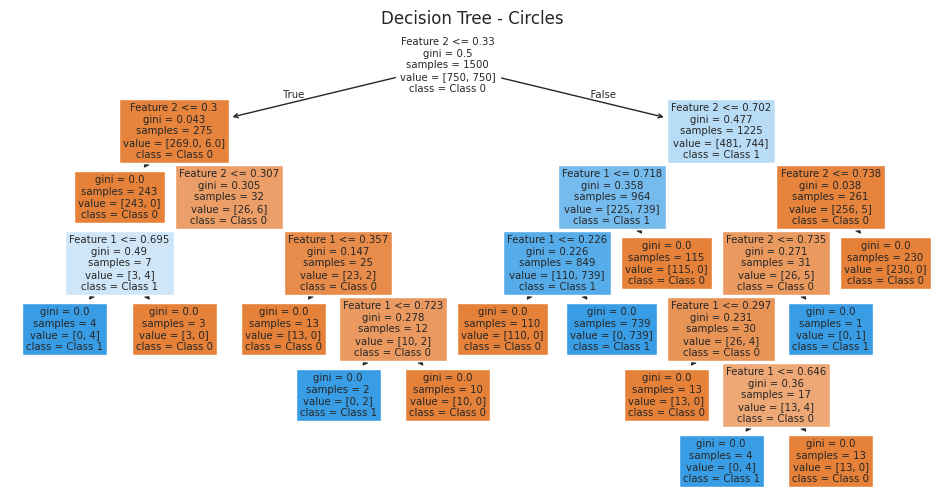

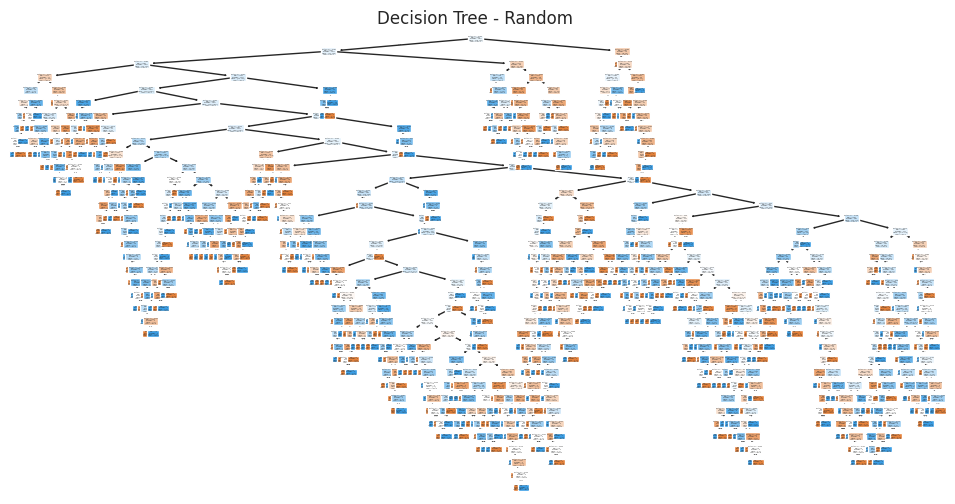

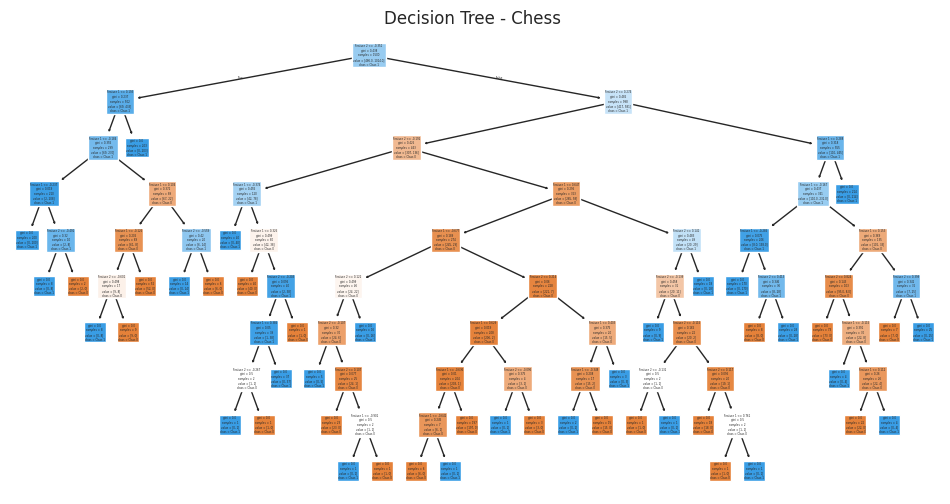

In [14]:
print("Decision Trees without pruning:")
plot_decision_trees_for_all_datasets(datasets)

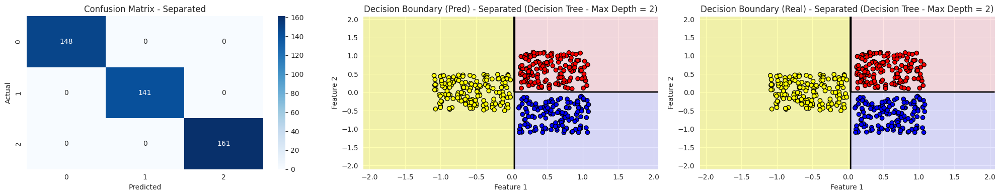

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      1.00      1.00       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



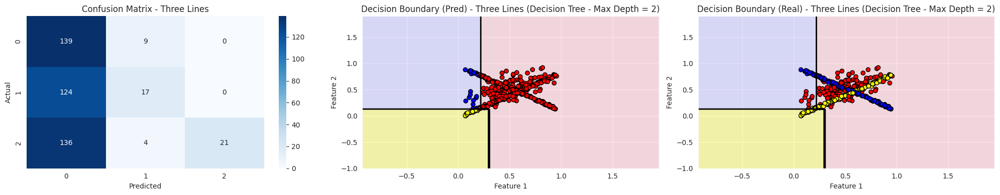

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.35      0.94      0.51       148
         1.0       0.57      0.12      0.20       141
         2.0       1.00      0.13      0.23       161

    accuracy                           0.39       450
   macro avg       0.64      0.40      0.31       450
weighted avg       0.65      0.39      0.31       450



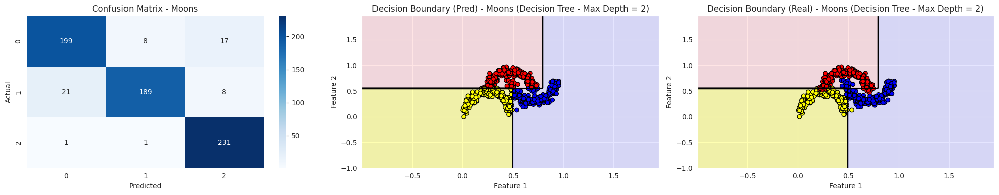

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.90      0.89      0.89       224
           1       0.95      0.87      0.91       218
           2       0.90      0.99      0.94       233

    accuracy                           0.92       675
   macro avg       0.92      0.92      0.92       675
weighted avg       0.92      0.92      0.92       675



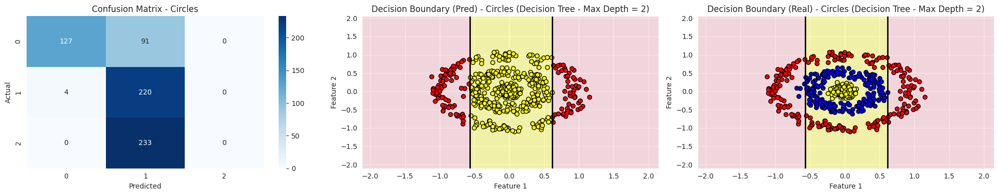

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.97      0.58      0.73       218
           1       0.40      0.98      0.57       224
           2       1.00      0.00      0.00       233

    accuracy                           0.51       675
   macro avg       0.79      0.52      0.43       675
weighted avg       0.79      0.51      0.43       675



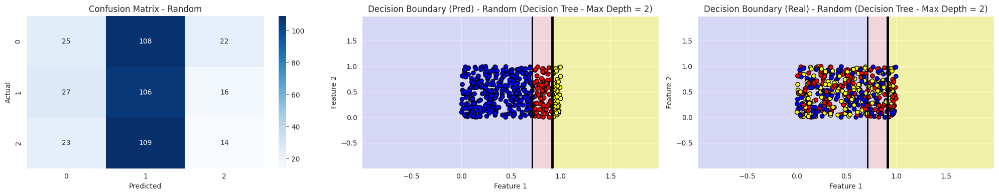

Classification Report Random:
              precision    recall  f1-score   support

           0       0.33      0.16      0.22       155
           1       0.33      0.71      0.45       149
           2       0.27      0.10      0.14       146

    accuracy                           0.32       450
   macro avg       0.31      0.32      0.27       450
weighted avg       0.31      0.32      0.27       450



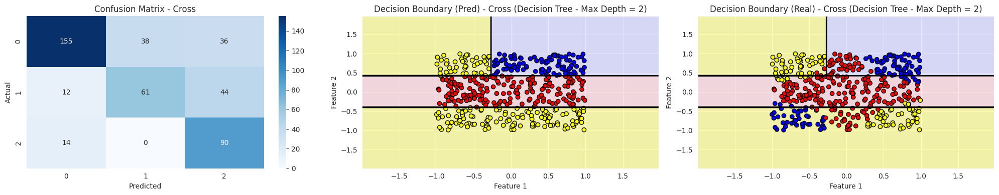

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.86      0.68      0.76       229
           1       0.62      0.52      0.56       117
           2       0.53      0.87      0.66       104

    accuracy                           0.68       450
   macro avg       0.67      0.69      0.66       450
weighted avg       0.72      0.68      0.68       450



In [147]:
evaluate_model(DecisionTreeClassifier(max_depth=2), "Decision Tree - Max Depth = 2", datasets)


Decision Trees with max_depth=2:


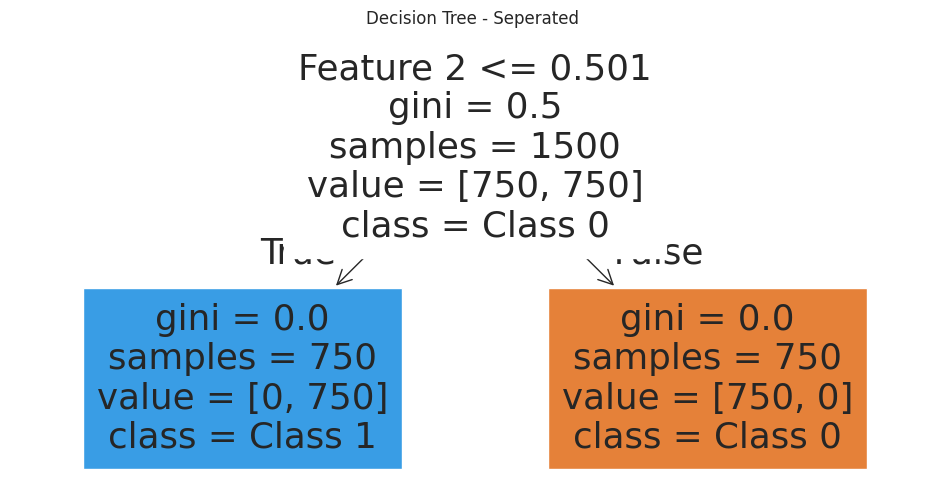

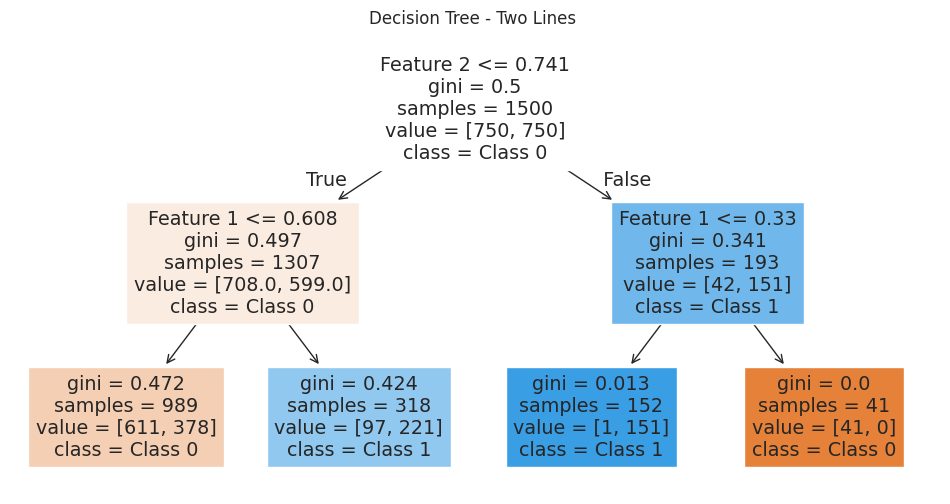

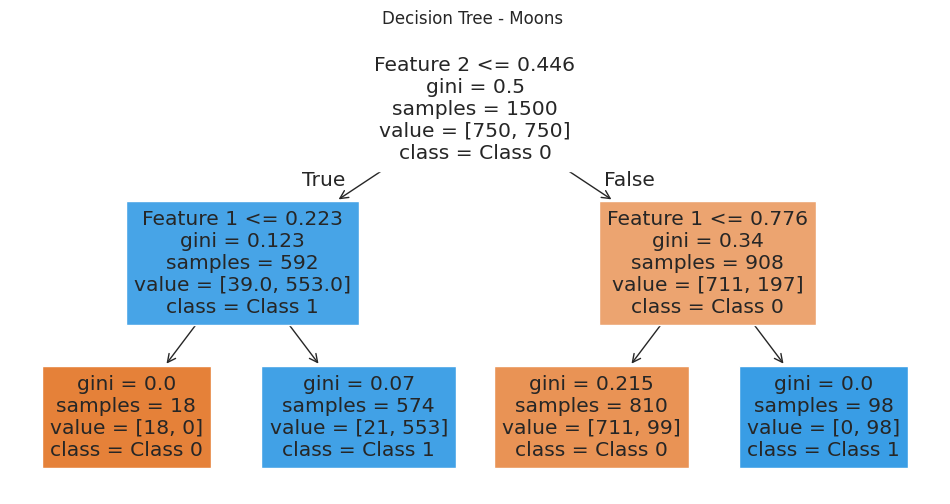

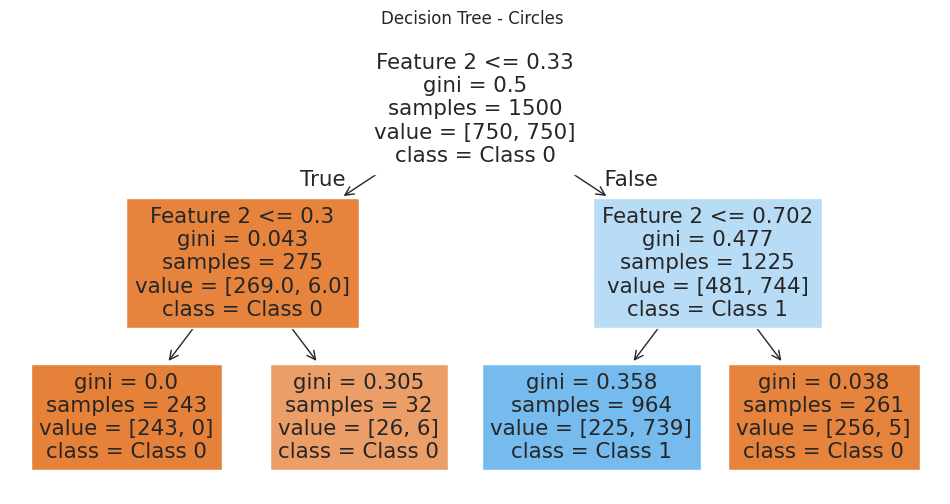

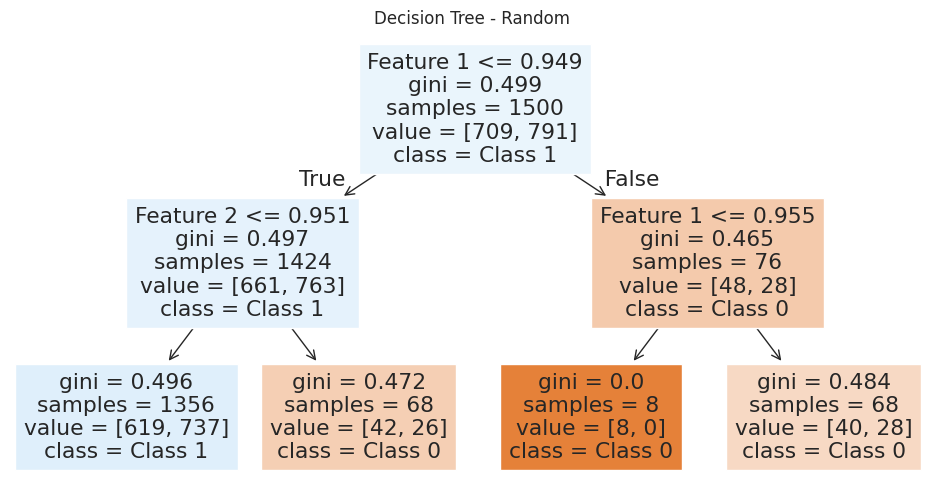

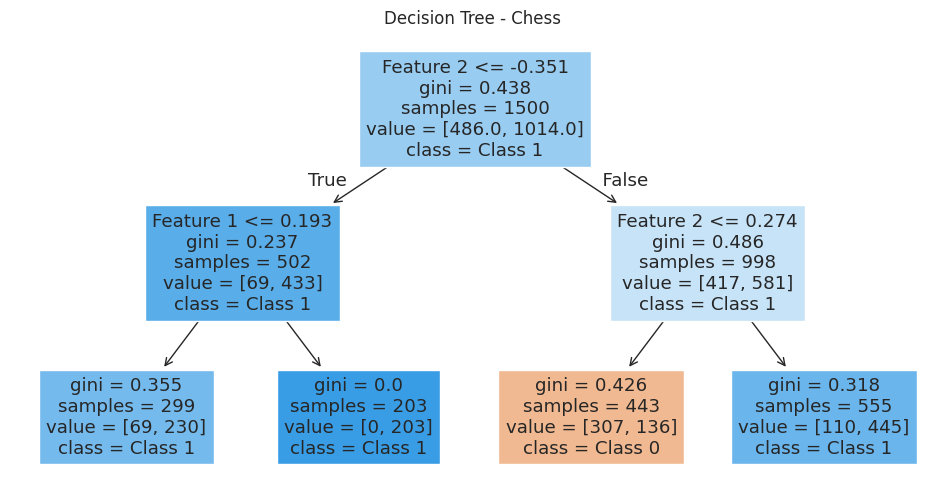

In [16]:
print("\nDecision Trees with max_depth=2:")
plot_decision_trees_for_all_datasets(datasets, max_depth=2)

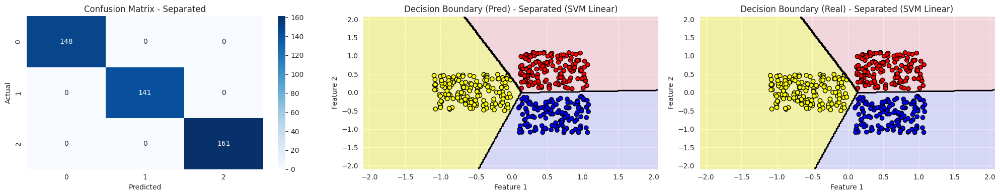

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      1.00      1.00       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



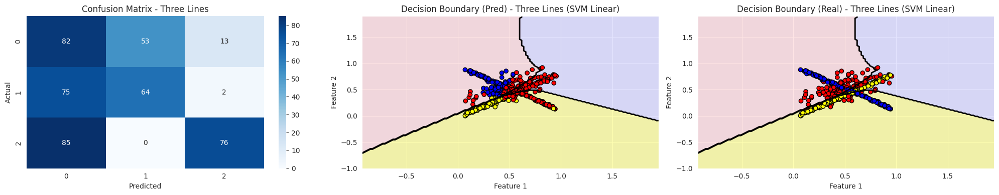

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.34      0.55      0.42       148
         1.0       0.55      0.45      0.50       141
         2.0       0.84      0.47      0.60       161

    accuracy                           0.49       450
   macro avg       0.57      0.49      0.51       450
weighted avg       0.58      0.49      0.51       450



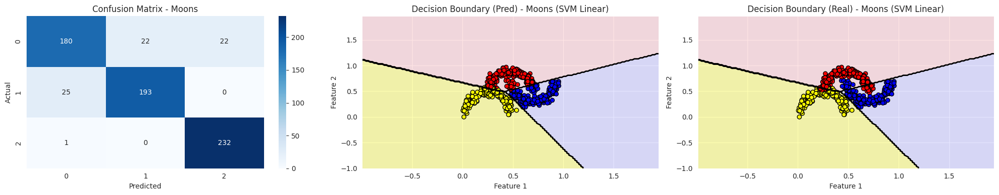

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.87      0.80      0.84       224
           1       0.90      0.89      0.89       218
           2       0.91      1.00      0.95       233

    accuracy                           0.90       675
   macro avg       0.89      0.89      0.89       675
weighted avg       0.90      0.90      0.89       675



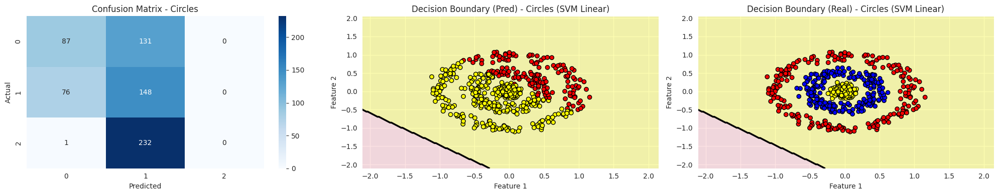

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.53      0.40      0.46       218
           1       0.29      0.66      0.40       224
           2       1.00      0.00      0.00       233

    accuracy                           0.35       675
   macro avg       0.61      0.35      0.29       675
weighted avg       0.61      0.35      0.28       675



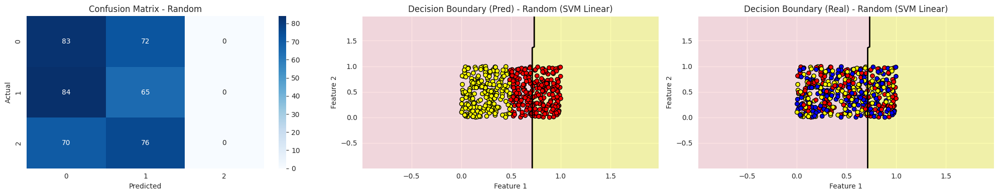

Classification Report Random:
              precision    recall  f1-score   support

           0       0.35      0.54      0.42       155
           1       0.31      0.44      0.36       149
           2       1.00      0.00      0.00       146

    accuracy                           0.33       450
   macro avg       0.55      0.32      0.26       450
weighted avg       0.55      0.33      0.26       450



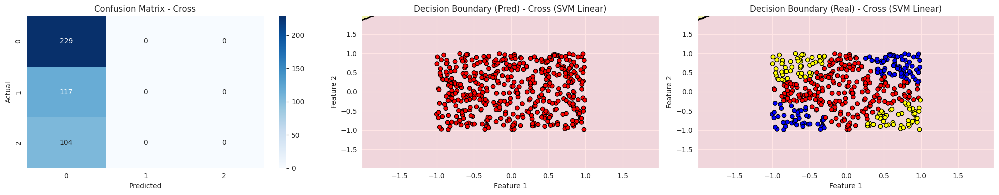

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.51      1.00      0.67       229
           1       1.00      0.00      0.00       117
           2       1.00      0.00      0.00       104

    accuracy                           0.51       450
   macro avg       0.84      0.33      0.22       450
weighted avg       0.75      0.51      0.34       450



In [148]:
evaluate_model(SVC(kernel="linear", probability=True), "SVM Linear", datasets)

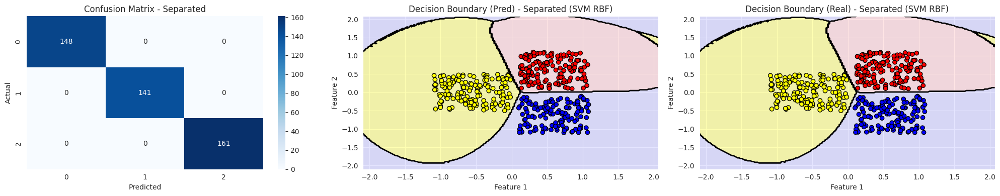

Classification Report Separated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       148
         1.0       1.00      1.00      1.00       141
         2.0       1.00      1.00      1.00       161

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450



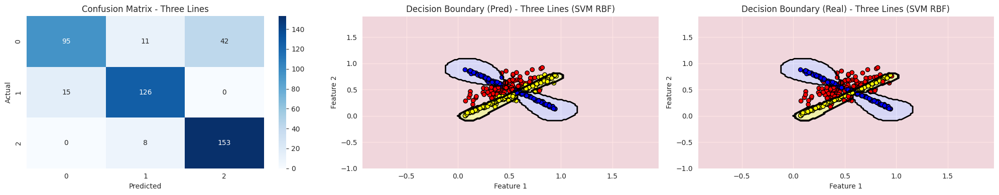

Classification Report Three Lines:
              precision    recall  f1-score   support

         0.0       0.86      0.64      0.74       148
         1.0       0.87      0.89      0.88       141
         2.0       0.78      0.95      0.86       161

    accuracy                           0.83       450
   macro avg       0.84      0.83      0.83       450
weighted avg       0.84      0.83      0.83       450



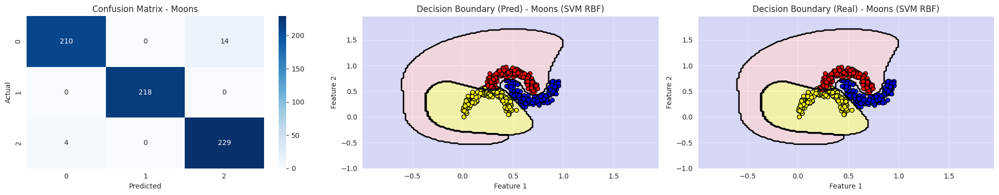

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       224
           1       1.00      1.00      1.00       218
           2       0.94      0.98      0.96       233

    accuracy                           0.97       675
   macro avg       0.97      0.97      0.97       675
weighted avg       0.97      0.97      0.97       675



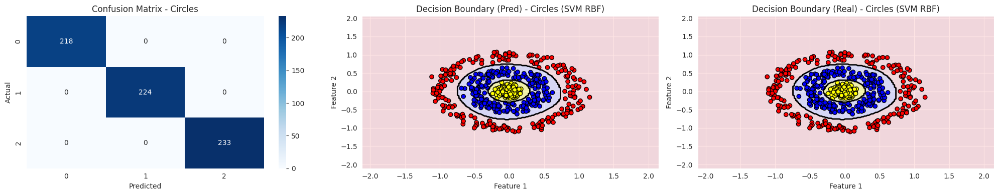

Classification Report Circles:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       218
           1       1.00      1.00      1.00       224
           2       1.00      1.00      1.00       233

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
weighted avg       1.00      1.00      1.00       675



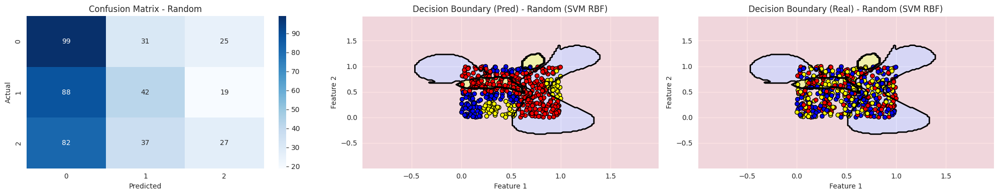

Classification Report Random:
              precision    recall  f1-score   support

           0       0.37      0.64      0.47       155
           1       0.38      0.28      0.32       149
           2       0.38      0.18      0.25       146

    accuracy                           0.37       450
   macro avg       0.38      0.37      0.35       450
weighted avg       0.38      0.37      0.35       450



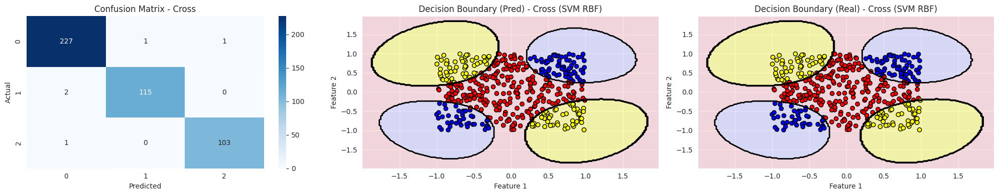

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       229
           1       0.99      0.98      0.99       117
           2       0.99      0.99      0.99       104

    accuracy                           0.99       450
   macro avg       0.99      0.99      0.99       450
weighted avg       0.99      0.99      0.99       450



In [149]:
evaluate_model(SVC(kernel="rbf", probability=True), "SVM RBF", datasets)
